In [1]:
import scanpy as sc
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

import squidpy as sq

import celltypist
from celltypist import models

from matplotlib import rcParams

In [2]:
pd.set_option('display.max_rows', 100)

In [3]:
# input
sample = "0033516_adjacent"

# Load Xenium data

In [4]:
adata = sc.read_10x_h5("data/" + sample + "/cell_feature_matrix.h5")

In [5]:
adata

AnnData object with n_obs × n_vars = 128756 × 5001
    var: 'gene_ids', 'feature_types', 'genome'

In [6]:
print(adata.X[1:20, 1:20])

  (0, 11)	1.0
  (2, 12)	1.0
  (2, 16)	1.0
  (3, 14)	1.0
  (4, 7)	1.0
  (6, 1)	1.0
  (10, 7)	1.0
  (10, 13)	1.0
  (15, 16)	1.0


## Add cell data

In [7]:
cells = pd.read_csv("data/" + sample + "/cells.csv.gz")

# Set indext to barcode
cells.index = cells.cell_id

cells

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method
cell_id,,,,,,,,,,,,,,
aaaalbkb-1,aaaalbkb-1,494.587372,1497.218262,795,0,0,0,0,1,796,81.461878,20.997657,3,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaaambfn-1,aaaambfn-1,491.540802,1487.405151,675,0,0,0,0,0,675,83.539066,28.900001,2,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaabjcij-1,aaabjcij-1,487.184479,1493.383057,781,0,0,0,0,1,782,66.966721,26.958282,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaacbbae-1,aaacbbae-1,476.936798,1525.450439,383,1,0,0,0,1,385,33.009220,15.127344,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaacnfcj-1,aaacnfcj-1,481.816986,1522.196533,261,0,0,0,0,0,261,42.627502,21.945938,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oinmhbdl-1,oinmhbdl-1,888.059753,4995.166992,21,0,0,0,0,0,21,18.830157,18.830157,1,Segmented by nucleus expansion of 5.0µm
oinnlapi-1,oinnlapi-1,1022.065552,4759.057617,13,0,0,0,0,0,13,13.321094,11.018125,1,Segmented by nucleus expansion of 5.0µm
oinnmkcb-1,oinnmkcb-1,1023.611511,4762.193848,3,0,0,0,0,0,3,9.121563,9.121563,1,Segmented by nucleus expansion of 5.0µm


In [8]:
cells = cells.drop(columns='total_counts')  # included in QC calculation below

In [9]:
adata.obs = adata.obs.join(cells, how='left')

In [10]:
adata.obs['sample'] = sample

## Load previous clustering

In [11]:
clust = pd.read_csv("data/" + sample + "/analysis/clustering/gene_expression_graphclust/clusters.csv") 

In [12]:
clust.index = clust.Barcode
clust = clust.drop("Barcode", axis=1)
clust = clust.rename(columns={"Cluster": "graphclust"})

In [13]:
clust

,graphclust
Barcode,
aaaalbkb-1,15
aaaambfn-1,15
aaabjcij-1,15
aaacbbae-1,15
aaacnfcj-1,15
...,...
oinmhbdl-1,8
oinnlapi-1,8
oinnmkcb-1,8


In [14]:
clust.graphclust = clust.graphclust.astype(str)
categories = sorted(clust.graphclust.unique(), key=int)
clust.graphclust = pd.Categorical(clust.graphclust, categories=categories, ordered=True)
clust.graphclust

Barcode
aaaalbkb-1    15
aaaambfn-1    15
aaabjcij-1    15
aaacbbae-1    15
aaacnfcj-1    15
              ..
oinmhbdl-1     8
oinnlapi-1     8
oinnmkcb-1     8
oinodgdj-1    11
oioachnh-1    11
Name: graphclust, Length: 127761, dtype: category
Categories (27, object): ['1' < '2' < '3' < '4' ... '24' < '25' < '26' < '27']

In [15]:
#clust.graphclust = clust.graphclust.astype('int').astype('str').astype('category')
#clust.graphclust = clust.graphclust.astype('category')
#clust.graphclust = clust.graphclust.astype('object').astype('category')

In [16]:
#adata.obs = adata.obs.drop('graphclust', axis=1)

In [17]:
adata.obs = adata.obs.join(clust, how='left')

# Load CellTypist models

In [18]:
# Load celltypist models of fibroblasts from Friedrich (our) study
model_fibro = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/friedrich_fibroblasts.pkl")

In [19]:
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 52
📂 Storing models in /home/jovyan/.celltypist/data/models
💾 Downloading model [1/52]: Immune_All_Low.pkl
💾 Downloading model [2/52]: Immune_All_High.pkl
💾 Downloading model [3/52]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/52]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/52]: Adult_Human_MTG.pkl
💾 Downloading model [6/52]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/52]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/52]: Adult_Human_Skin.pkl
💾 Downloading model [9/52]: Adult_Mouse_Gut.pkl
💾 Downloading model [10/52]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [11/52]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [12/52]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [13/52]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [14/52]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [15/52]: COVID19_Immune_Landsc

In [20]:
#models.models_description()

In [21]:
# Elmentaite gut model
#model_gi = models.Model.load(model = 'Cells_Intestinal_Tract.pkl')

# Load healthy megagut CellTypist model
#model_megagut = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/1_full_healthy_reference_all_ages_organs_finalmodel.pkl")
#model_megagut = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/1_full_healthy_reference_all_ages_organs_allgenes.pkl")

In [22]:
#model_megagut.cell_types

In [23]:
# Healthy megagut models
#model_megagutSmallIntestine = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/8_healthy_reference_AP_small_intestine_allgenes.pkl")
#model_megagutLargeIntestine = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/9_healthy_reference_AP_large_intestine_allgenes.pkl")

In [24]:
# Healthy + disease megagut levels at 3 levels
model_megagutSmallIntestineDisease_lvl1 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl1.pkl")

In [25]:
model_megagutSmallIntestineDisease_lvl1

CellTypist model with 7 cell types and 34645 features
    date: 2024-08-28 02:00:11.200958
    cell types: B and B plasma, Endothelial, ..., T and NK cells
    features: MIR1302-2HG, OR4F5, ..., AC007325.2

In [26]:
model_megagutSmallIntestineDisease_lvl3 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl3.pkl")

In [27]:
model_megagutSmallIntestineDisease_lvl3

CellTypist model with 105 cell types and 34645 features
    date: 2024-09-09 19:43:40.301080
    cell types: Angiogenic_pericyte, BEST4_enterocyte_colonocyte, ..., gdT_naive
    features: MIR1302-2HG, OR4F5, ..., AC007325.2

# Process data

In [28]:
# QC metrics
sc.pp.calculate_qc_metrics(adata, percent_top=(10, 20, 50, 150), inplace=True)


<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

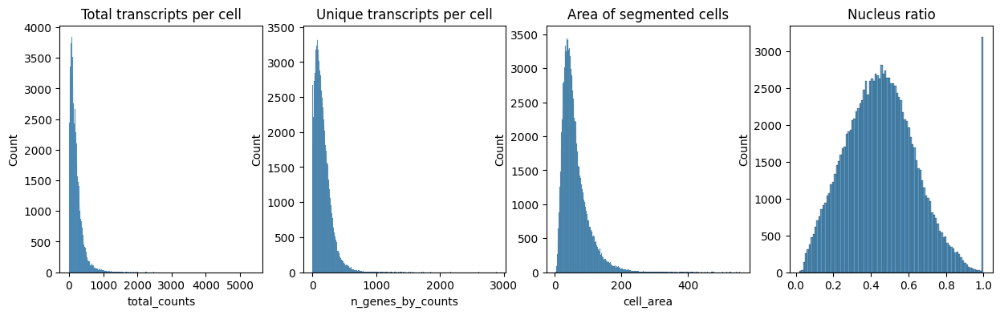

In [29]:
# Plot histograms
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

In [30]:
adata

AnnData object with n_obs × n_vars = 128756 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [31]:
# Filter out cells with fewer than specified reads
sc.pp.filter_cells(adata, min_counts=5)

In [32]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [33]:
adata.layers["counts"] = adata.X.copy()  # store raw counts

In [34]:
# Normalize according to CellTypist requirement
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10000)

# Pseudo log transform
sc.pp.log1p(adata)

In [35]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)

In [36]:
# UMAP
sc.tl.umap(adata)

IOStream.flush timed out


In [37]:
# Clustering
sc.tl.leiden(adata)

IOStream.flush timed out


In [38]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# CellTypist predictions

## Run CellTypist for each model

In [39]:
# Run celltypist on data, healthy only
# 1h runtime for 250k cells
predictions_megagutSmall = celltypist.annotate(
    adata,
    model = model_megagutSmallIntestineDisease_lvl3,
    majority_voting = True,
    mode = 'best match',
)

🔬 Input data has 126670 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 4985 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25
IOStream.flush timed out
🗳️ Majority voting the predictions
✅ Majority voting done!


In [40]:
adata = predictions_megagutSmall.to_adata(prefix='megagut_lvl3_')

In [41]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: '

In [42]:
# Run celltypist on data, healthy+diseased, small intestine, level1 broad annotation
predictions_megagutSmall = celltypist.annotate(
    adata,
    model = model_megagutSmallIntestineDisease_lvl1,
    majority_voting = True,
    mode = 'best match',
)

🔬 Input data has 126670 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 4985 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
🗳️ Majority voting the predictions
✅ Majority voting done!


In [43]:
adata = predictions_megagutSmall.to_adata(prefix='megagut_lvl1_')

In [44]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns

## Visualize CellTypist predictions

In [45]:
# conf_thresh = 0.2
# prefix = "Elmentaite_"

In [46]:
# sort predicted cell types by mean confidence score from CellTypist
def sortCellTypistConfScore(adata, prefix):
    mean_conf = adata.obs.groupby(
        adata.obs[prefix + 'majority_voting'])[[prefix + 'conf_score']] \
        .mean() \
        .sort_values(by=prefix + "conf_score", ascending=False)
    return(mean_conf)


# Adds new prefix + 'majority_voting_conf' column to adata.obs containing cell types
def filterCellTypistMajorityVoting(adata, prefix, mean_conf, conf_thresh):
    # Add new column
    adata.obs[prefix + 'majority_voting_conf'] = adata.obs[prefix + 'majority_voting']
    
    # Filter out low confidence prediction labels
    exclude_cell_types = mean_conf.index[mean_conf.iloc[:, 0] < conf_thresh]
    adata.obs[prefix + 'majority_voting_conf'][adata.obs[prefix + 'majority_voting_conf'].isin(exclude_cell_types)] = pd.NA
    
    adata.obs[prefix + 'majority_voting_conf'] = adata.obs[prefix + 'majority_voting_conf'].cat.remove_unused_categories()
    
    return(adata)

In [47]:
# mean_conf = sortCellTypistConfScore(adata, "Elmentaite_")
# mean_conf

In [48]:
# rcParams["figure.figsize"] = (10, 4)
# sc.pl.violin(adata, prefix + "conf_score", groupby= prefix + "majority_voting", rotation=90, order=mean_conf.index, stripplot=False, inner="box")

In [49]:
#adata.obs = adata.obs.drop(columns="Elmentaite_majority_voting_conf")

In [50]:
# # add column to obs
# adata = filterCellTypistMajorityVoting(adata, prefix, mean_conf, conf_thresh)

In [51]:
# adata

In [52]:
# prefix = "megagut_"

# mean_conf = sortCellTypistConfScore(adata, prefix)
# mean_conf

In [53]:
# rcParams["figure.figsize"] = (7, 4)
# sc.pl.violin(adata, prefix + "conf_score", groupby=prefix + "majority_voting", rotation=90, order=mean_conf.index, stripplot=False, inner="box")

In [54]:
# adata = filterCellTypistMajorityVoting(adata, prefix, mean_conf, 0.1)

In [55]:
# sc.pl.umap(
#     adata,
#     color=[
#         "leiden",
#         #"megagut_conf_score",
#         "megagut_majority_voting",
#         #"megagut_majority_voting_conf"
#     ],
#     wspace=0.5,
# )

In [56]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns

... storing 'segmentation_method' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


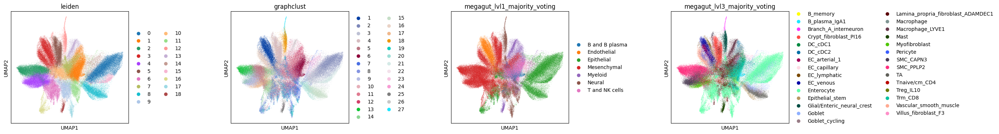

In [57]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "leiden", "graphclust", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", 
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

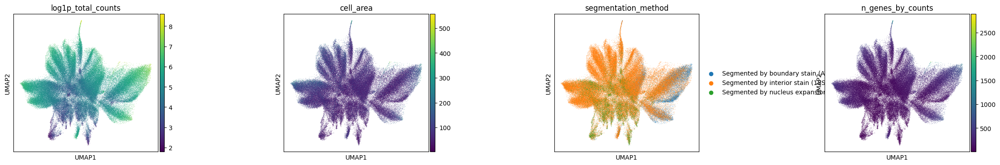

In [58]:
# Technical plots
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "log1p_total_counts", "cell_area", "segmentation_method", "n_genes_by_counts"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

<Axes: xlabel='graphclust', ylabel='megagut_lvl3_majority_voting'>

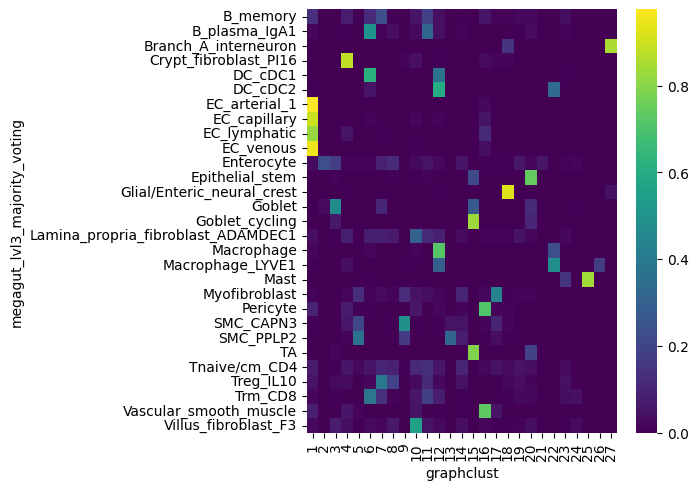

In [59]:
conf_mat = sc.metrics.confusion_matrix("megagut_lvl3_majority_voting", "graphclust", adata.obs)
rcParams['figure.figsize'] = 5, 5.5
#sns.clustermap(
sns.heatmap(
    conf_mat,
    xticklabels=True,
    yticklabels=True,
    cmap='viridis'
)

<Axes: xlabel='leiden', ylabel='megagut_lvl3_majority_voting'>

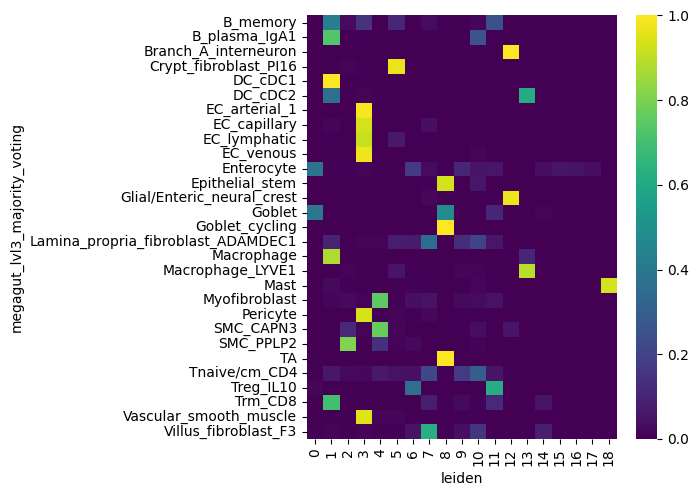

In [60]:
conf_mat = sc.metrics.confusion_matrix("megagut_lvl3_majority_voting", "leiden", adata.obs)
rcParams['figure.figsize'] = 5, 5.5
#sns.clustermap(
sns.heatmap(
    conf_mat,
    xticklabels=True,
    yticklabels=True,
    cmap='viridis'
)

In [61]:
#adata.obs.megagut_lvl3_majority_voting.value_counts()

<Axes: xlabel='megagut_lvl3_majority_voting'>

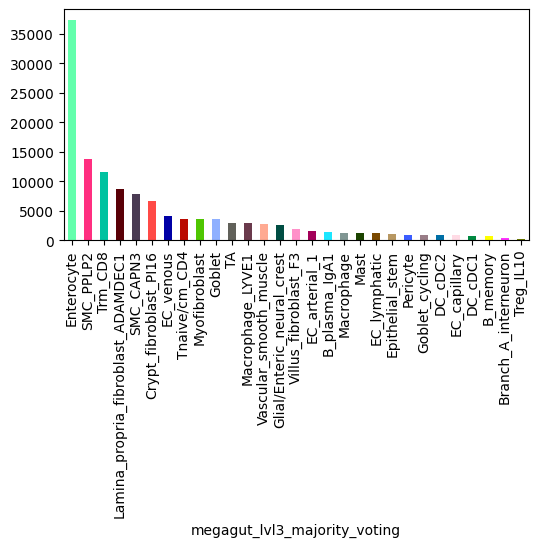

In [62]:
# Barplot of numbers of cells
rcParams["figure.figsize"] = (6, 3)

# Get color dictionary based on previous colors
color_dict = dict(zip(adata.obs.megagut_lvl3_majority_voting.cat.categories, adata.uns['megagut_lvl3_majority_voting_colors']))

values = adata.obs.megagut_lvl3_majority_voting.value_counts()
values.plot.bar(color=values.index.map(color_dict))

## Marker plots for label transfer

In [63]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

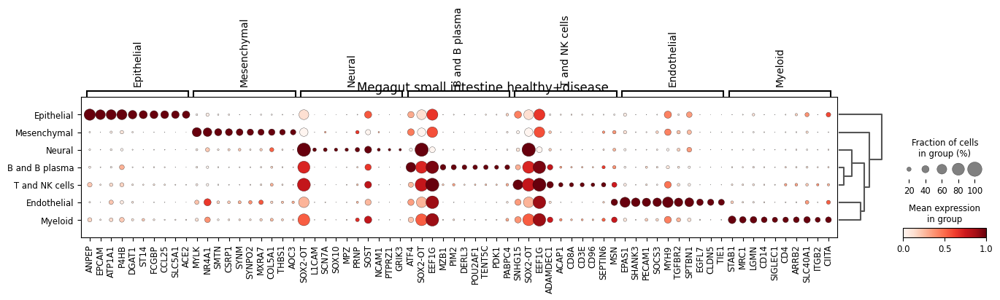

In [64]:
# Investigate markers of CellTypist labels
sc.tl.rank_genes_groups(adata, groupby='megagut_lvl1_majority_voting', method='wilcoxon')

sc.pl.rank_genes_groups_dotplot(
    adata, groupby='megagut_lvl1_majority_voting', standard_scale="var", n_genes=10, title="Megagut small intestine healthy+disease", figsize=(16, 2.5)
)

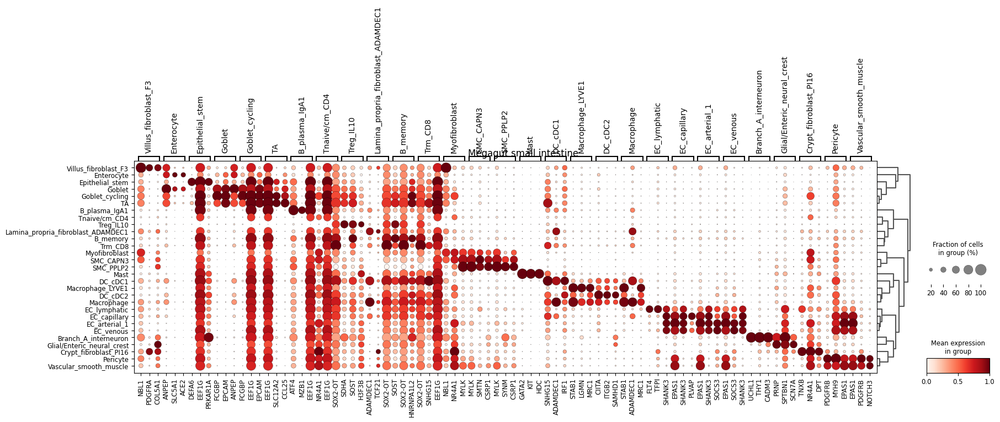

In [65]:
# Investigate markers of CellTypist labels
sc.tl.rank_genes_groups(adata, groupby='megagut_lvl3_majority_voting', method='wilcoxon')

sc.pl.rank_genes_groups_dotplot(
    adata, groupby='megagut_lvl3_majority_voting', standard_scale="var", n_genes=3, title="Megagut small intestine", figsize=(20, 5)
)

In [66]:
adata.obs.megagut_lvl3_majority_voting.value_counts()

megagut_lvl3_majority_voting
Enterocyte                            37317
SMC_PPLP2                             13708
Trm_CD8                               11619
Lamina_propria_fibroblast_ADAMDEC1     8660
SMC_CAPN3                              7771
Crypt_fibroblast_PI16                  6713
EC_venous                              4090
Tnaive/cm_CD4                          3659
Myofibroblast                          3582
Goblet                                 3551
TA                                     2851
Macrophage_LYVE1                       2813
Vascular_smooth_muscle                 2674
Glial/Enteric_neural_crest             2629
Villus_fibroblast_F3                   1904
EC_arterial_1                          1590
B_plasma_IgA1                          1413
Macrophage                             1211
Mast                                   1209
EC_lymphatic                           1154
Epithelial_stem                        1114
Pericyte                                920
Gob

In [67]:
# # Plot marker expression of top-5 markers
# rcParams["figure.figsize"] = (2.5, 2.5)
# sc.pl.umap(
#     adata,
#     color=[*sc.get.rank_genes_groups_df(adata, group="Crypt_fibroblast_PI16").head(8)['names'], "leiden"],
#     legend_loc="on data",
#     frameon=False,
#     ncols=3,
# )

## Run CellTypist with fibroblast model

In [68]:
# Run celltypist on data
predictions = celltypist.annotate(
    adata,
    model = model_fibro,
    majority_voting = True,
    mode = 'prob match',
    p_thres = 0.5)

🔬 Input data has 126670 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 529 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
🗳️ Majority voting the predictions
✅ Majority voting done!


In [69]:
predictions

CellTypist prediction result for 126670 query cells
    predicted_labels: data frame with 3 columns ('predicted_labels', 'over_clustering', 'majority_voting')
    decision_matrix: data frame with 126670 query cells and 9 cell types
    probability_matrix: data frame with 126670 query cells and 9 cell types
    adata: AnnData object referred

In [70]:
# Add celltypist results to AnnData object
# Columns: 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5'
adata = predictions.to_adata(insert_prob=True)

In [71]:
# rename probability columns
subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

adata.obs = adata.obs.rename(columns={x: x + "_prob" for x in subtypes})

In [72]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'


In [73]:
adata.obs.majority_voting.value_counts()

majority_voting
Unassigned    121215
PC              3260
S2              1158
S3              1037
Name: count, dtype: int64

In [74]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'


In [76]:
#adata_sub adata.obs.megagut_lvl1_majority_voting == 'Mesenchymal'

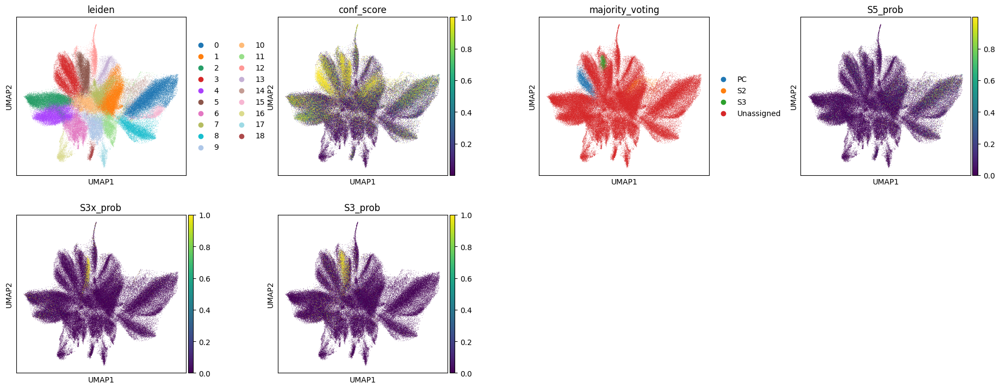

In [77]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
#        "n_genes_by_counts",
#        "log1p_total_counts",
        "leiden",
        "conf_score",
        "majority_voting",
        "S5_prob", "S3x_prob", "S3_prob"
    ],
    wspace=0.4,
)

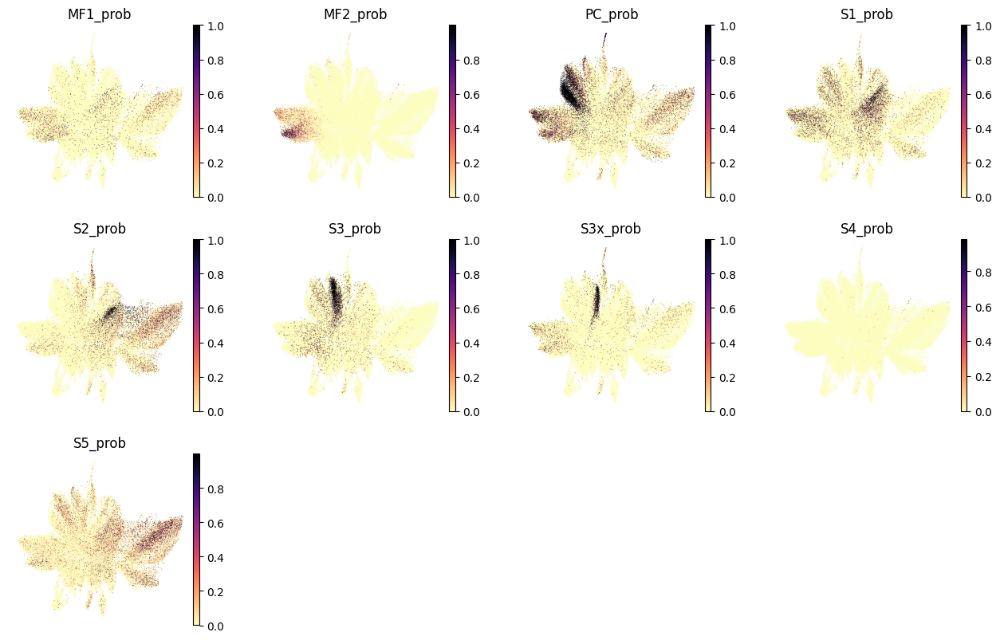

In [78]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)
sc.pl.umap(adata, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

## Map S5 cells to megagut label transfer

Text(0, 0.5, 'S5 cells')

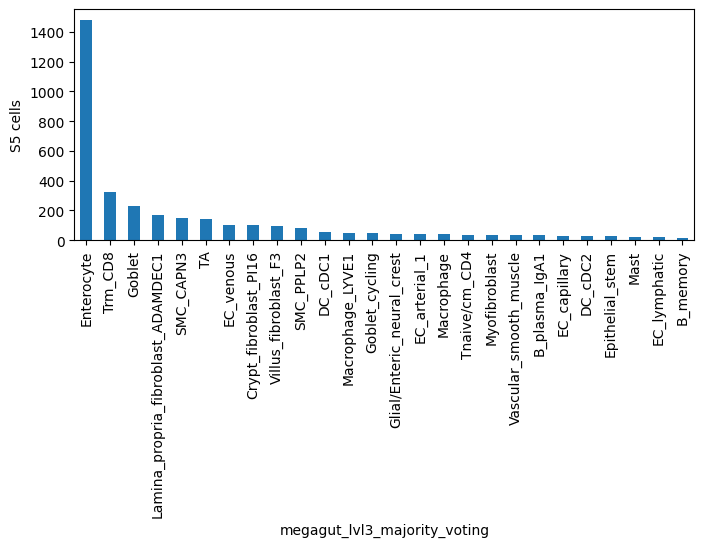

In [79]:
# Megagut healthy
rcParams["figure.figsize"] = (8, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

Text(0, 0.5, 'S5 cells')

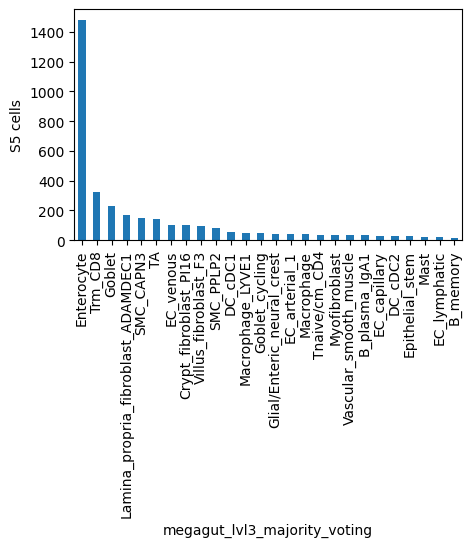

In [80]:
# Megagut healthy small intestine
rcParams["figure.figsize"] = (5, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

Text(0, 0.5, 'S5 cells')

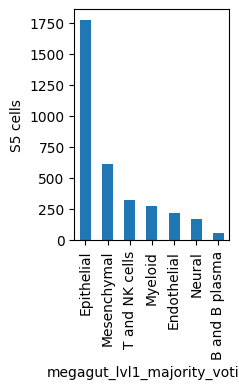

In [81]:
# Megagut small intestine healthy and disease, level 1 annotation
rcParams["figure.figsize"] = (2, 3)

values = adata.obs.megagut_lvl1_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

## Other fibroblast subtypes

Text(0, 0.5, 'S3x cells')

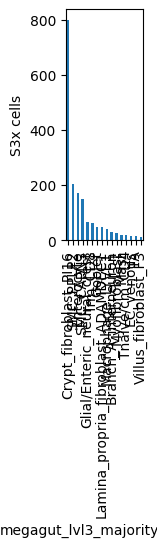

In [82]:
# S3x
rcParams["figure.figsize"] = (1, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S3x_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S3x cells")

Text(0, 0.5, 'S3 cells')

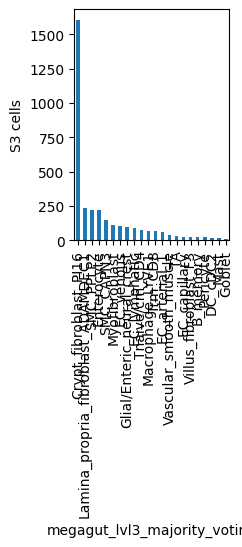

In [83]:
# S3
rcParams["figure.figsize"] = (2, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S3_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S3 cells")

Text(0, 0.5, 'S1 cells')

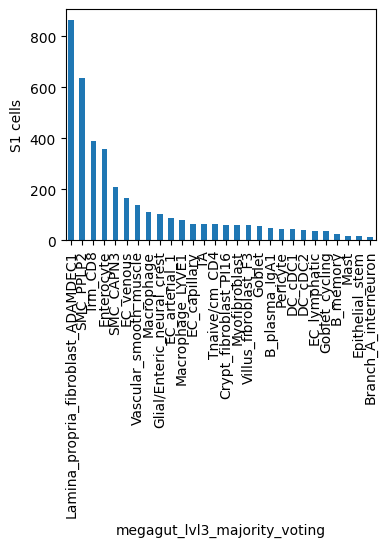

In [84]:
# S1
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S1_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S1 cells")

Text(0, 0.5, 'MF1 cells')

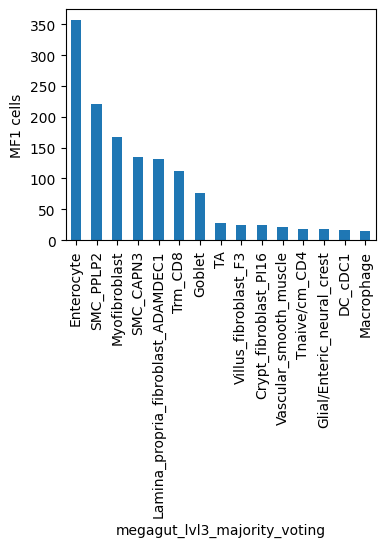

In [85]:
# Myofibroblasts
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.MF1_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("MF1 cells")

Text(0, 0.5, 'PC cells')

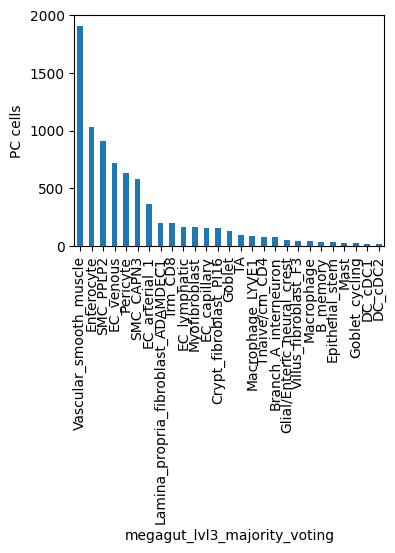

In [86]:
# Pericytes
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.PC_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("PC cells")

## Mesenchymal subset

In [87]:
# Mesenchymal subset
adata_mesen = adata[adata.obs.megagut_lvl1_majority_voting == 'Mesenchymal']

In [88]:
adata_mesen

View of AnnData object with n_obs × n_vars = 49133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5

In [89]:
#adata_mesen.obs.join(predictions.predicted_labels, rsuffix="_fibro")

In [90]:
# Recompute dimensionality reduction across samples
sc.pp.pca(adata_mesen)
sc.pp.neighbors(adata_mesen)

In [91]:
# UMAP
sc.tl.umap(adata_mesen)

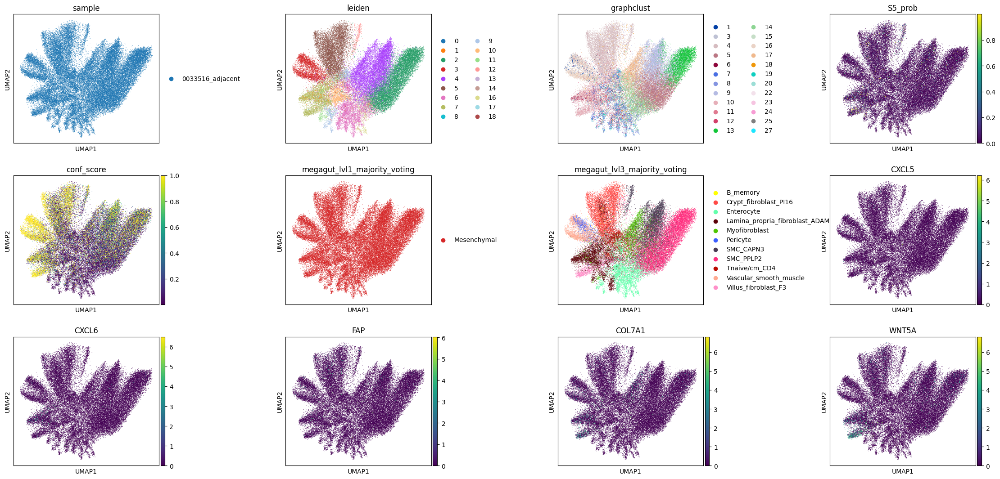

In [92]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen,
    color=[
        "sample", "leiden", "graphclust", "S5_prob", "conf_score", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", "CXCL5", "CXCL6", "FAP", "COL7A1", "WNT5A"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

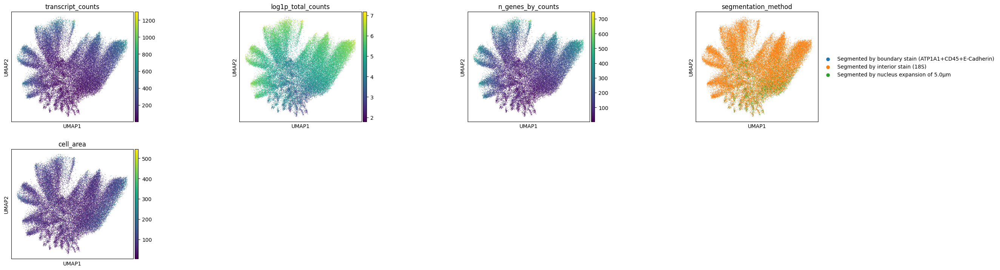

In [93]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen,
    color=[
        "transcript_counts", "log1p_total_counts", "n_genes_by_counts", "segmentation_method", "cell_area"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

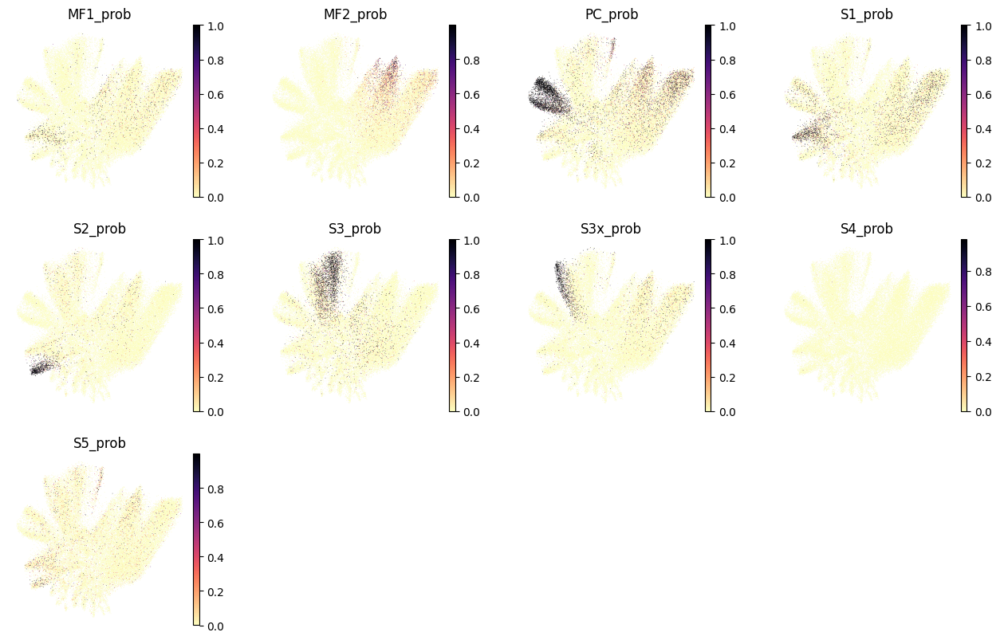

In [94]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)

subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

sc.pl.umap(adata_mesen, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

### Filter mesenchymal cells

In [95]:
# Mesenchymal subset
adata_mesen_subset = adata_mesen.copy()

In [96]:
# More stringent filter on counts
sc.pp.filter_cells(adata_mesen_subset, min_counts=200)

In [97]:
adata_mesen_subset

AnnData object with n_obs × n_vars = 44738 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

In [98]:
adata_mesen_subset.obs.megagut_lvl3_majority_voting.value_counts()

megagut_lvl3_majority_voting
SMC_PPLP2                             13262
SMC_CAPN3                              7643
Crypt_fibroblast_PI16                  6657
Lamina_propria_fibroblast_ADAMDEC1     5005
Myofibroblast                          3122
Vascular_smooth_muscle                 2674
Enterocyte                             2609
Tnaive/cm_CD4                          1382
Villus_fibroblast_F3                   1377
Pericyte                                920
B_memory                                 87
Name: count, dtype: int64

In [99]:
exclude_cells = ["Enterocyte", "Tnaive/cm_CD4", "B_memory", "Glial/Enteric_neural_crest", "Trm_CD8"]

adata_mesen_subset = adata_mesen_subset[~adata_mesen_subset.obs.megagut_lvl3_majority_voting.isin(exclude_cells)]

In [100]:
adata_mesen_subset

View of AnnData object with n_obs × n_vars = 40660 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5

In [101]:
# Recompute dimensionality reduction across samples
sc.pp.pca(adata_mesen_subset)
sc.pp.neighbors(adata_mesen_subset)

In [102]:
# UMAP
sc.tl.umap(adata_mesen_subset)

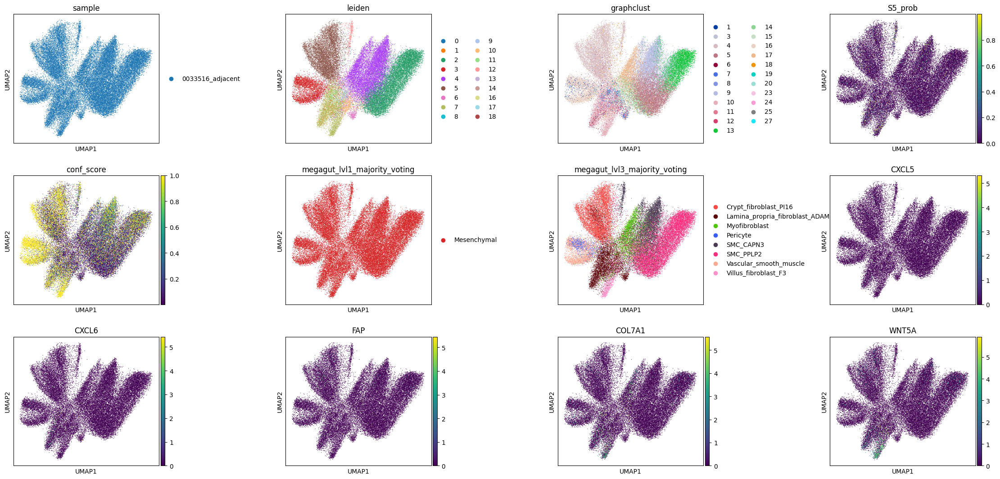

In [103]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen_subset,
    color=[
        "sample", "leiden", "graphclust", "S5_prob", "conf_score", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", "CXCL5", "CXCL6", "FAP", "COL7A1", "WNT5A"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

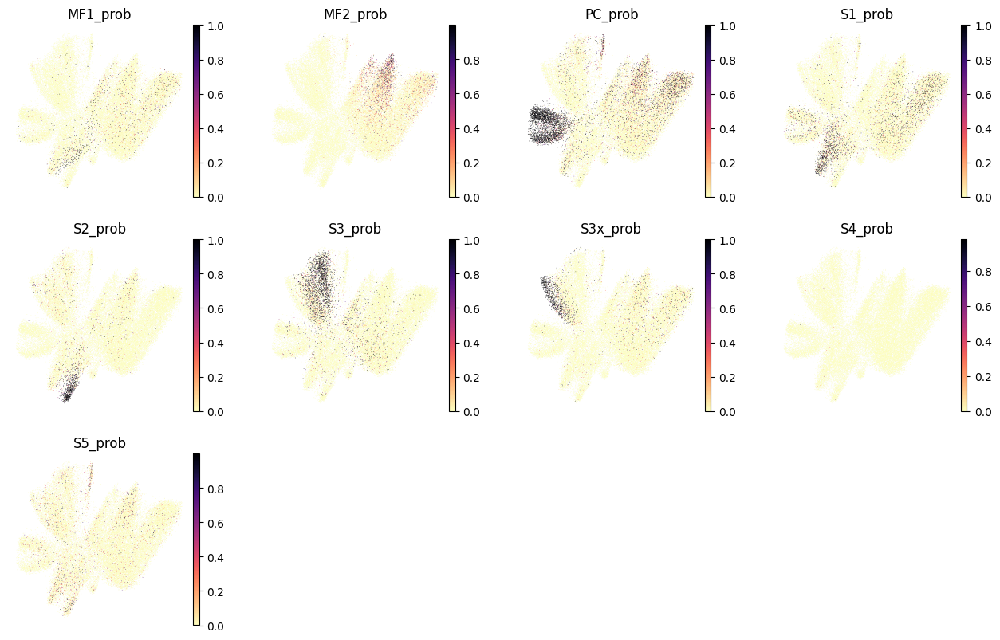

In [104]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)

subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

sc.pl.umap(adata_mesen_subset, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

# Spatial plots

In [105]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [106]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'


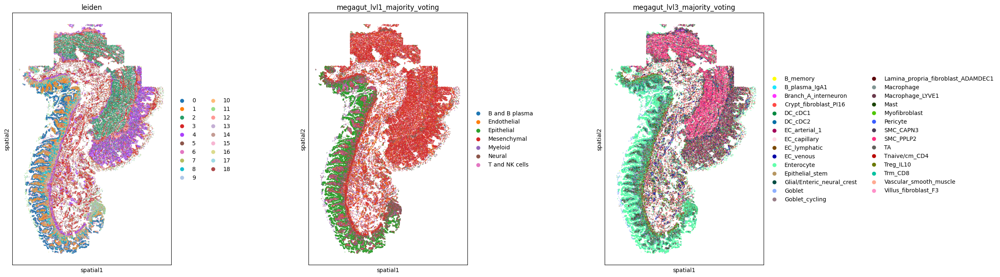

In [107]:
# Megagut small intestine
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl1_majority_voting",
        "megagut_lvl3_majority_voting"],  # healthy only
    wspace=0.1,
    size=0.1,
    figsize=(8, 8),
    na_color="lightgrey"
)

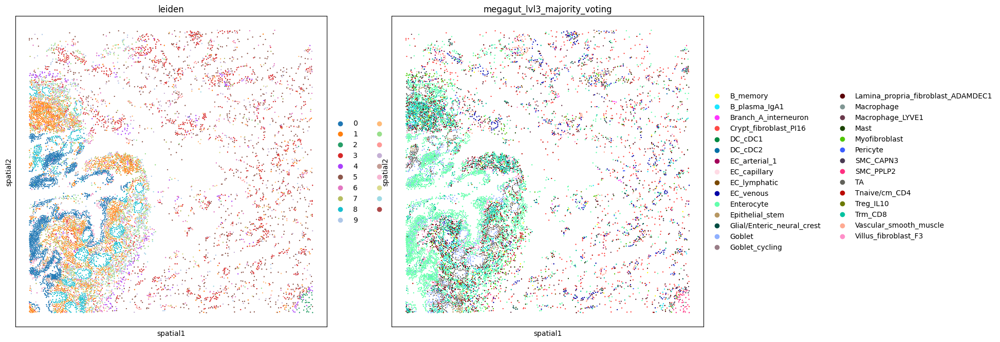

In [108]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl3_majority_voting"],
    wspace=0.1,
    size=1.0,
    figsize=(8, 8),
    na_color="lightgrey",
    crop_coord=(1500, 1500, 3000, 3000)
)

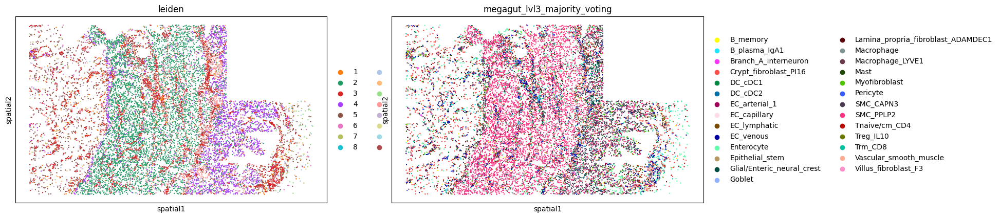

In [109]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl3_majority_voting"],
    wspace=0.1,
    size=1.0,
    figsize=(8, 8),
    na_color="lightgrey",
    crop_coord=(2500, 1500, 5000, 3000)
)

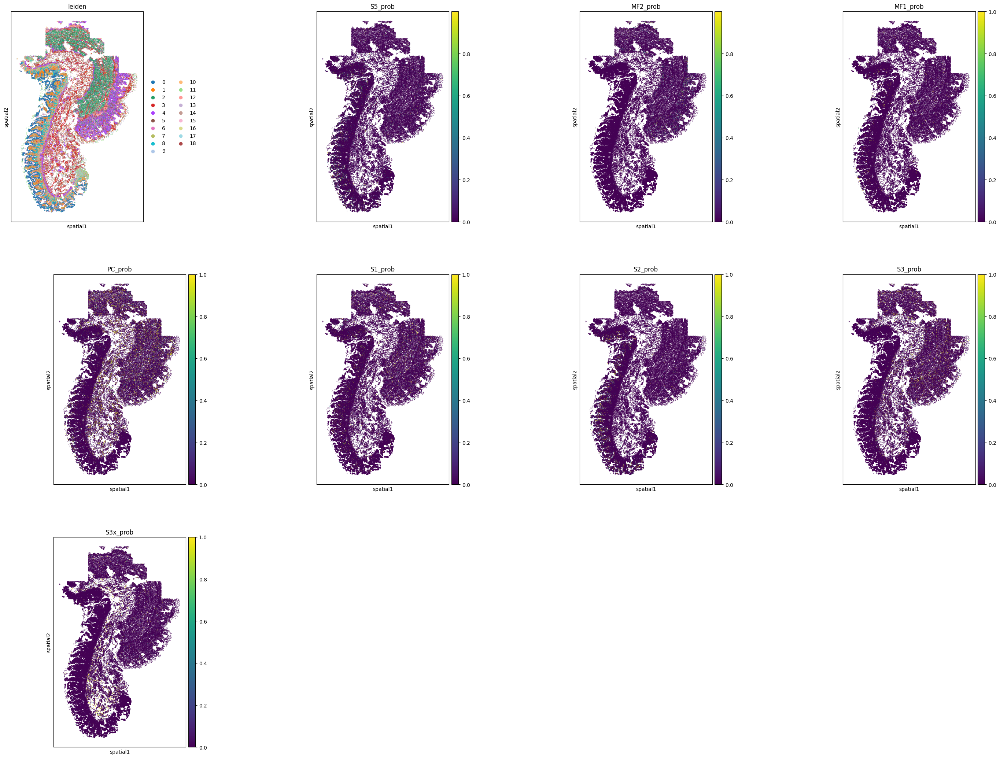

In [110]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden", "S5_prob", "MF2_prob", "MF1_prob", "PC_prob", "S1_prob",  "S2_prob",  "S3_prob",  "S3x_prob", 
    ],
    wspace=0.1,
    size=0.1,
    figsize=(8,8)
)

In [111]:
adata

AnnData object with n_obs × n_vars = 126670 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'


In [112]:
# Write to file
adata.write_h5ad("h5ad/" + sample + ".h5ad")